# optical flow

In [1]:
import os
import datetime
import time 
import cv2

import warnings
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=UserWarning)

print(cv2.__version__, datetime.datetime.now() )


4.5.5 2022-08-05 13:03:08.597711


In [2]:
!nvidia-smi

Fri Aug  5 13:03:08 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 515.48.07    Driver Version: 515.48.07    CUDA Version: 11.7     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA TITAN RTX    Off  | 00000000:01:00.0 Off |                  N/A |
| 41%   32C    P8    15W / 250W |   3850MiB / 24576MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [3]:
!wget -N -q  https://raw.githubusercontent.com/haofeixu/flow1d/main/demo/dogs-jump/00033.jpg
!wget -N -q  https://raw.githubusercontent.com/haofeixu/flow1d/main/demo/dogs-jump/00034.jpg
!wget -N -q  https://raw.githubusercontent.com/haofeixu/flow1d/main/demo/dogs-jump/00035.jpg
!wget -N -q  https://raw.githubusercontent.com/haofeixu/flow1d/main/demo/dogs-jump/00036.jpg

In [9]:
import numpy as np 
import cv2
import time 
import matplotlib.pyplot as plt 

print("opencv ver : ", cv2.__version__)

tic=time.time()
#frame1 = (cv2.imread('/mydir/00033.jpg', cv2.IMREAD_GRAYSCALE))
#frame2 = (cv2.imread('/mydir/00034.jpg', cv2.IMREAD_GRAYSCALE))

frame1 = (cv2.imread('./00033.jpg' ) )
frame2 = (cv2.imread('./00034.jpg' ) )
          
frame1 = cv2.cvtColor(frame1, cv2.COLOR_BGR2RGB)  
frame2 = cv2.cvtColor(frame2, cv2.COLOR_BGR2RGB)      


print( frame1.shape, frame2.shape )
W,H =  int(frame1.shape[1]/2), int(frame1.shape[0]/2 )

frame1 = cv2.resize(frame1, ( W,H  ) )
frame2 = cv2.resize(frame2, ( W,H  ) )

print( frame1.shape, frame2.shape )

toc = time.time()

opencv ver :  4.5.5
(2160, 3840, 3) (2160, 3840, 3)
(1080, 1920, 3) (1080, 1920, 3)


def blendImages(image1, image2, alpha=0.5):            
    import cv2
    newImage = cv2.addWeighted(image1, alpha,image2, (1-alpha), 0)
    return newImage

def flow_arrow(flow, step=8, size=4):
    step = step
    ratio =  flow.shape[1] / flow.shape[0] 
    plt.figure(figsize=( int(size * ratio) ,size))
    plt.title('Optical Flow vector')
    Q= plt.quiver( np.arange(0, flow.shape[1] -1, step), 
               np.arange(flow.shape[0]-1 , -1, -step),             
               flow[::step, ::step, 0], 
               flow[::step, ::step, 1], units='x', pivot='mid', width=1,  scale=0.4, color='red')
    plt.axis('off')
    plt.show()
    
#@title flow color
def make_colorwheel():
    import numpy as np     
    '''
    Generates a color wheel for optical flow visualization as presented in:
        Baker et al. "A Database and Evaluation Methodology for Optical Flow" (ICCV, 2007)
        URL: http://vision.middlebury.edu/flow/flowEval-iccv07.pdf
    According to the C++ source code of Daniel Scharstein
    According to the Matlab source code of Deqing Sun
    '''

    RY = 15
    YG = 6
    GC = 4
    CB = 11
    BM = 13
    MR = 6

    ncols = RY + YG + GC + CB + BM + MR
    colorwheel = np.zeros((ncols, 3))
    col = 0

    # RY
    colorwheel[0:RY, 0] = 255
    colorwheel[0:RY, 1] = np.floor(255 * np.arange(0, RY) / RY)
    col = col + RY
    # YG
    colorwheel[col:col + YG, 0] = 255 - np.floor(255 * np.arange(0, YG) / YG)
    colorwheel[col:col + YG, 1] = 255
    col = col + YG
    # GC
    colorwheel[col:col + GC, 1] = 255
    colorwheel[col:col + GC, 2] = np.floor(255 * np.arange(0, GC) / GC)
    col = col + GC
    # CB
    colorwheel[col:col + CB, 1] = 255 - np.floor(255 * np.arange(CB) / CB)
    colorwheel[col:col + CB, 2] = 255
    col = col + CB
    # BM
    colorwheel[col:col + BM, 2] = 255
    colorwheel[col:col + BM, 0] = np.floor(255 * np.arange(0, BM) / BM)
    col = col + BM
    # MR
    colorwheel[col:col + MR, 2] = 255 - np.floor(255 * np.arange(MR) / MR)
    colorwheel[col:col + MR, 0] = 255
    return colorwheel


def flow_compute_color(u, v, convert_to_bgr=False):
    '''
    Applies the flow color wheel to (possibly clipped) flow components u and v.
    According to the C++ source code of Daniel Scharstein
    According to the Matlab source code of Deqing Sun
    :param u: np.ndarray, input horizontal flow
    :param v: np.ndarray, input vertical flow
    :param convert_to_bgr: bool, whether to change ordering and output BGR instead of RGB
    :return:
    '''
    import numpy as np  
    flow_image = np.zeros((u.shape[0], u.shape[1], 3), np.uint8)

    colorwheel = make_colorwheel()  # shape [55x3]
    ncols = colorwheel.shape[0]

    rad = np.sqrt(np.square(u) + np.square(v))
    a = np.arctan2(-v, -u) / np.pi

    fk = (a + 1) / 2 * (ncols - 1) # + 1
    k0 = np.floor(fk).astype(np.int32)
    k1 = k0 + 1
    k1[k1 == ncols] = 1
    f = fk - k0

    for i in range(colorwheel.shape[1]):
        tmp = colorwheel[:, i]
        col0 = tmp[k0] / 255.0
        col1 = tmp[k1] / 255.0
        col = (1 - f) * col0 + f * col1

        idx = (rad <= 1)
        col[idx] = 1 - rad[idx] * (1 - col[idx])
        col[~idx] = col[~idx] * 0.75  # out of range?

        # Note the 2-i => BGR instead of RGB
        ch_idx = 2 - i if convert_to_bgr else i
        flow_image[:, :, ch_idx] = np.floor(255 * col)

    return flow_image


def flow_to_color(flow_uv, clip_flow=None, convert_to_bgr=False):
    '''
    Expects a two dimensional flow image of shape [H,W,2]
    According to the C++ source code of Daniel Scharstein
    According to the Matlab source code of Deqing Sun
    :param flow_uv: np.ndarray of shape [H,W,2]
    :param clip_flow: float, maximum clipping value for flow
    :return:
    '''
    import numpy as np  
    assert flow_uv.ndim == 3, 'input flow must have three dimensions'
    assert flow_uv.shape[2] == 2, 'input flow must have shape [H,W,2]'

    if clip_flow is not None:
        flow_uv = np.clip(flow_uv, 0, clip_flow)

    u = flow_uv[:, :, 0]
    v = flow_uv[:, :, 1]

    rad = np.sqrt(np.square(u) + np.square(v))
    rad_max = np.max(rad)

    epsilon = 1e-5
    u = u / (rad_max + epsilon)
    v = v / (rad_max + epsilon)

    return flow_compute_color(u, v, convert_to_bgr)        
    

# review input 

In [11]:
image_blended = blendImages(frame1, frame2)

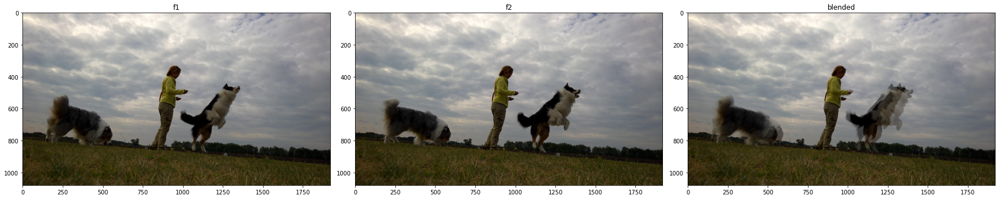

In [12]:
fig_size_default = 8
num_plot = 3
fig, axs = plt.subplots(1, num_plot, figsize= (fig_size_default*num_plot, fig_size_default ) , constrained_layout=True) 
axs[0].imshow(frame1 ,  interpolation=None,   )
axs[0].set_title('f1')
axs[1].imshow(frame2,  interpolation=None,       )
axs[1].set_title('f2')
axs[2].imshow( image_blended ,  interpolation=None,      )
axs[2].set_title('blended')

plt.show()

# GPU accelerated OpenCV Optical Flow (TV-L1)

opencv ver :  4.5.5
(2160, 3840) (2160, 3840)
(1080, 1920) (1080, 1920)
load data 0.0408017635345459
(1080, 1920)
(1080, 1920)
malloc 0.016069889068603516
memcpy cpu to gpu for cuda of 0.00616455078125
init cuda of
<cuda_OpticalFlowDual_TVL1 0x7fb0749c7f50>
float32 input
cal cuda tvl1 (1080, 1920) (1080, 1920, 2) 0.2541685104370117
(1080, 1920, 2)
stat :  52.87707 -77.35734 -0.94064116


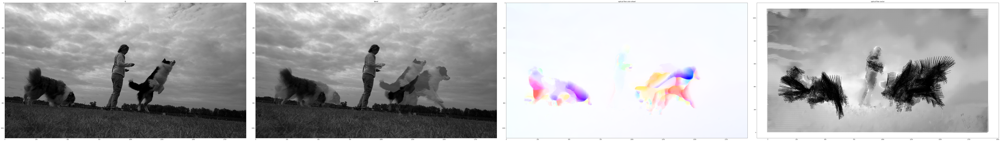

In [27]:
import numpy as np 
import cv2
import time 

print("opencv ver : ", cv2.__version__)

tic=time.time()
frame1 = (cv2.imread('./00033.jpg', cv2.IMREAD_GRAYSCALE))
frame2 = (cv2.imread('./00036.jpg', cv2.IMREAD_GRAYSCALE))

print( frame1.shape, frame2.shape )
W,H =  int(frame1.shape[1]/2), int(frame1.shape[0]/2 )

frame1 = cv2.resize(frame1, ( W,H  ) )
frame2 = cv2.resize(frame2, ( W,H  ) )

print( frame1.shape, frame2.shape )


toc = time.time()

dur = toc - tic
print("load data", dur)

print( frame1.shape )
print( frame2.shape )

tic = time.time()
f1_GPU = cv2.cuda_GpuMat(frame1.shape)
f2_GPU = cv2.cuda_GpuMat(frame2.shape)
toc = time.time()
dur = toc - tic 
print("malloc", dur)

tic = time.time()
f1_GPU.upload( np.float32(frame1)/255 )
f2_GPU.upload( np.float32(frame2)/255 )
toc = time.time()
dur = toc - tic 
print("memcpy cpu to gpu for cuda of", dur)

print("init cuda of")
tvl1_of = cv2.cuda_OpticalFlowDual_TVL1.create()
print(tvl1_of)

print("float32 input")
tic = time.time()
flow_tvl1_gpu = tvl1_of.calc(f1_GPU, f2_GPU, None)
toc = time.time()
flow_tvl1_cpu = flow_tvl1_gpu.download()
dur = toc - tic 
print("cal cuda tvl1", frame1.shape,  flow_tvl1_cpu.shape, dur)


plot_f1 = frame1
plot_f2 = frame2
plot_blend =  blendImages(plot_f1, plot_f2) 
plot_diff = frame1 - frame2 
plot_flow = flow_tvl1_cpu
plot_color = flow_to_color(plot_flow)
ratio =  plot_flow.shape[1] / plot_flow.shape[0] 

step = 6
scale = 0.2


print(plot_flow.shape)
print("stat : ", np.max(plot_flow )    , np.min(plot_flow ) , np.mean(plot_flow))

fig_size_default = 16
num_plot = 4
fig, axs = plt.subplots(1, num_plot, figsize= (fig_size_default*num_plot *ratio , fig_size_default  )  , constrained_layout=True ) 
axs[0].imshow( plot_f1,  interpolation=None,   cmap='gray' )
axs[0].set_title('f1')

axs[1].imshow(plot_blend ,  interpolation=None,   cmap='gray'  )
axs[1].set_title('blend')

axs[2].imshow( plot_color ,  interpolation=None,      )
axs[2].set_title('optical flow color wheel')
 
axs[3].quiver( np.arange(0, plot_flow.shape[1] -1, step), 
               np.arange( plot_flow.shape[0]-1 , -1, -step),             
               plot_flow[::step, ::step, 0], 
               plot_flow[::step, ::step, 1], 
               units='x', pivot='mid', width=1,  scale=scale, )

axs[3].set_title('optical flow vector')
plt.show()



# backward warping result

In [50]:
def flow_warp(x, flow, interp_mode='bilinear', padding_mode='zeros'):
    
    """Warp an image or feature map with optical flow
    Args:
        x (Tensor): size (N, C, H, W)
        flow (Tensor): size (N, H, W, 2), normal value
        interp_mode (str): 'nearest' or 'bilinear'
        padding_mode (str): 'zeros' or 'border' or 'reflection'

    Returns:
        Tensor: warped image or feature map
    """

    import torch.nn.functional as F
    
    print(x.shape, flow.shape)
    assert x.size()[-2:] == flow.size()[1:3]
    B, C, H, W = x.size()
    # mesh grid
    grid_y, grid_x = torch.meshgrid(torch.arange(0, H), torch.arange(0, W))
    print(grid_y.shape, grid_x.shape)
    grid = torch.stack((grid_x, grid_y), 2).float()  # W(x), H(y), 2
    print(grid.shape)
    grid.requires_grad = False
    grid = grid.type_as(x)
    vgrid = grid + flow
    print(vgrid.shape)
    # scale grid to [-1,1]
    vgrid_x = 2.0 * vgrid[:, :, :, 0] / max(W - 1, 1) - 1.0
    vgrid_y = 2.0 * vgrid[:, :, :, 1] / max(H - 1, 1) - 1.0
    vgrid_scaled = torch.stack((vgrid_x, vgrid_y), dim=3)
    print(vgrid_x.shape, vgrid_y.shape, vgrid_scaled.shape)
    print(x.type(),vgrid_scaled.type() )
    
    output = F.grid_sample(x, vgrid_scaled, mode=interp_mode, padding_mode=padding_mode)
    return output

In [51]:
def custom_warp(x, flo): # almost same 
    """
    warp an image/tensor (im2) back to im1, according to the optical flow
    x: [B, C, H, W] (im2)
    flo: [B, H, W, 2 ] (flo)
    """
    import torch.nn.functional as F
    print("x flow", x.size(), flo.size() )
    B, C, H, W = x.size()
    print("BCHW", B,C,H,W )
    # mesh grid
    xx = torch.arange(0, W).view(1, -1).repeat(H, 1) # instead of meshgrid / torch stack
    yy = torch.arange(0, H).view(-1, 1).repeat(1, W)
    print("xx,yy", xx.size(),yy.size())    
    xx = xx.view(1,  H, W,1).repeat(B, 1, 1, 1)
    yy = yy.view(1,  H, W,1).repeat(B, 1, 1, 1)
    print("xx,yy", xx.size(),yy.size())
    grid = torch.cat((xx, yy), 3).float() 
    print("grid", grid.size(),flo.size() )
    
    vgrid = grid + flo
    # scale grid to [-1,1]
    vgrid[:,  :, :,0] = 2.0 * vgrid[:,  :, :,0].clone() / max(W - 1, 1) - 1.0  # different 
    vgrid[:,  :, :,1] = 2.0 * vgrid[:,  :, :,1].clone() / max(H - 1, 1) - 1.0

    vgrid = vgrid#.permute(0, 2, 3, 1)
    output = F.grid_sample(x, vgrid)   #  mode=interp_mode, padding_mode=padding_mode  
    mask = torch.ones(x.size())
    mask = F.grid_sample(mask, vgrid)

    mask[mask < 0.999] = 0
    mask[mask > 0] = 1

    return output

In [52]:
# https://github.com/princeton-vl/RAFT/issues/57
# https://github.com/princeton-vl/RAFT/issues/64
# from https://github.com/princeton-vl/RAFT/blob/master/core/utils/utils.py 

def forward_interpolate(flow):
    flow = flow.detach().cpu().numpy()
    dx, dy = flow[0], flow[1]

    ht, wd = dx.shape
    x0, y0 = np.meshgrid(np.arange(wd), np.arange(ht))

    x1 = x0 + dx
    y1 = y0 + dy
    
    x1 = x1.reshape(-1)
    y1 = y1.reshape(-1)
    dx = dx.reshape(-1)
    dy = dy.reshape(-1)

    valid = (x1 > 0) & (x1 < wd) & (y1 > 0) & (y1 < ht)
    x1 = x1[valid]
    y1 = y1[valid]
    dx = dx[valid]
    dy = dy[valid]

    flow_x = interpolate.griddata(
        (x1, y1), dx, (x0, y0), method='nearest', fill_value=0)

    flow_y = interpolate.griddata(
        (x1, y1), dy, (x0, y0), method='nearest', fill_value=0)

    flow = np.stack([flow_x, flow_y], axis=0)
    return torch.from_numpy(flow).float()

def upflow(flow, mode='bilinear', scaler=8):
    import torch.nn.functional as F
    new_size = (scaler * flow.shape[2], scaler * flow.shape[3])
    result = scaler * F.interpolate(flow, size=new_size, mode=mode, align_corners=True)
    return  result


def coords_grid(batch, ht, wd, device):
    coords = torch.meshgrid(torch.arange(ht, device=device), torch.arange(wd, device=device))
    print(coords[0].size() )    
    coords = torch.stack(coords[::-1], dim=0).float().permute(1,2,0)
    print(coords.size() )    
    coords = coords[None].repeat(batch, 1, 1, 1)
    print(coords.size() )  
    return coords 

def bilinear_sampler(img, coords, mode='bilinear', mask=False):
    """ Wrapper for grid_sample, uses pixel coordinates """
    import torch.nn.functional as F
    print( img.size(), coords.size() )
    B, C, H, W = img.size()
    print("b,c,h,w", B,C,H,W)
    xgrid, ygrid = coords.split([1,1], dim=-1)
    print("xgrid",xgrid.size(), "ygrid",ygrid.size() )
    xgrid = 2*xgrid/(W-1) - 1
    ygrid = 2*ygrid/(H-1) - 1
    print("xgrid",xgrid.size(), "ygrid",ygrid.size() )

    grid = torch.cat([xgrid, ygrid], dim=-1)
    print( "grid", grid.size())
    img = F.grid_sample(img, grid, align_corners=True)
    print(img.size)
    if mask:
        mask = (xgrid > -1) & (ygrid > -1) & (xgrid < 1) & (ygrid < 1)
        return img, mask.float()

    return img


def custom_warp2(x, flo):
    """
    warp an image/tensor (im2) back to im1, according to the optical flow
    x: [B, C, H, W] (im2)
    flo: [B, H, W, 2 ] (flo)
    """
    import torch.nn.functional as F
    
    B, C, H, W = x.size()
    print( x.size(), flo.size() )
    coords0  = coords_grid(1, H, W, 'cpu')
    print( coords0.size() )
    coords1 = coords0 + flo
    print( coords1.size() )
    result = bilinear_sampler(x, coords1)    
    print( result.size() )
    return result

In [53]:
import torch
img1 = torch.from_numpy( plot_f1 [None,None,:,:].astype(np.float32)  )
img2 = torch.from_numpy( plot_f2 [None,None,:,:].astype(np.float32)   )
flow_new = torch.from_numpy(plot_flow[None,:,:,:].astype(np.float32)   )
print(img1.size(), img1.type(), flow_new.size(), flow_new.type() )
result = flow_warp(img2, flow_new, interp_mode='bilinear', padding_mode='zeros')

print(np.mean( np.abs((img1-result).squeeze().numpy()) ) )
print(np.mean( np.abs((img2-result).squeeze().numpy()) ) )

torch.Size([1, 1, 1080, 1920]) torch.FloatTensor torch.Size([1, 1080, 1920, 2]) torch.FloatTensor
torch.Size([1, 1, 1080, 1920]) torch.Size([1, 1080, 1920, 2])
torch.Size([1080, 1920]) torch.Size([1080, 1920])
torch.Size([1080, 1920, 2])
torch.Size([1, 1080, 1920, 2])
torch.Size([1, 1080, 1920]) torch.Size([1, 1080, 1920]) torch.Size([1, 1080, 1920, 2])
torch.FloatTensor torch.FloatTensor
5.2738757
7.3492007


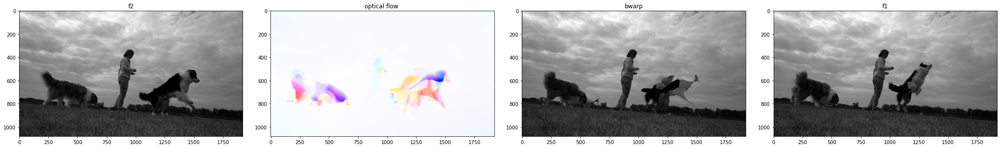

In [54]:
fig_size_default = 4
num_plot = 4
fig, axs = plt.subplots(1, num_plot, figsize= (fig_size_default*num_plot *ratio , fig_size_default  )  , constrained_layout=True ) 
axs[0].imshow( img2.squeeze(),  interpolation=None,   cmap='gray' )
axs[0].set_title('f2')

axs[1].imshow( plot_color )
axs[1].set_title('optical flow ')

axs[2].imshow(result.squeeze(),  interpolation=None,   cmap='gray'  )
axs[2].set_title('bwarp')

axs[3].imshow( img1.squeeze() ,  interpolation=None,   cmap='gray'       )
axs[3].set_title('f1')
 
plt.show()

In [66]:
import torch 
img1 = torch.from_numpy( plot_f1 [None,None,:,:].astype(np.float32)  )
img2 = torch.from_numpy( plot_f2 [None,None,:,:].astype(np.float32)   )
flow_new = torch.from_numpy(plot_flow[None,:,:,:].astype(np.float32)   )
print(img1.size(), img1.type(), flow_new.size(), flow_new.type() )
result = custom_warp(img2, flow_new )
print(np.mean( np.abs((img1-result).squeeze().numpy()) ) )
print(np.mean( np.abs((img2-result).squeeze().numpy()) ) )

torch.Size([1, 1, 1080, 1920]) torch.FloatTensor torch.Size([1, 1080, 1920, 2]) torch.FloatTensor
x flow torch.Size([1, 1, 1080, 1920]) torch.Size([1, 1080, 1920, 2])
BCHW 1 1 1080 1920
xx,yy torch.Size([1080, 1920]) torch.Size([1080, 1920])
xx,yy torch.Size([1, 1080, 1920, 1]) torch.Size([1, 1080, 1920, 1])
grid torch.Size([1, 1080, 1920, 2]) torch.Size([1, 1080, 1920, 2])
5.2738757
7.3492007


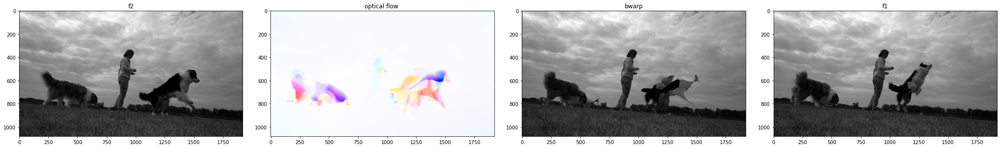

In [67]:
fig_size_default = 4
num_plot = 4
fig, axs = plt.subplots(1, num_plot, figsize= (fig_size_default*num_plot *ratio , fig_size_default  )  , constrained_layout=True ) 
axs[0].imshow( img2.squeeze(),  interpolation=None,   cmap='gray' )
axs[0].set_title('f2')

axs[1].imshow( plot_color )
axs[1].set_title('optical flow ')

axs[2].imshow(result.squeeze(),  interpolation=None,   cmap='gray'  )
axs[2].set_title('bwarp')

axs[3].imshow( img1.squeeze() ,  interpolation=None,   cmap='gray'       )
axs[3].set_title('f1')
 

plt.show()


# backward warping ( from RAFT )

In [64]:
import torch 
img1 = torch.from_numpy( plot_f1 [None,None,:,:].astype(np.float32)  )
img2 = torch.from_numpy( plot_f2 [None,None,:,:].astype(np.float32)   )
flow_new = torch.from_numpy(plot_flow[None,:,:,:].astype(np.float32)   )
print(img1.size(), img1.type(), flow_new.size(), flow_new.type() )
result = custom_warp2(img2, flow_new )
print(np.mean( np.abs((img1-result).squeeze().numpy()) ) )
print(np.mean( np.abs((img2-result).squeeze().numpy()) ) )

torch.Size([1, 1, 1080, 1920]) torch.FloatTensor torch.Size([1, 1080, 1920, 2]) torch.FloatTensor
torch.Size([1, 1, 1080, 1920]) torch.Size([1, 1080, 1920, 2])
torch.Size([1080, 1920])
torch.Size([1080, 1920, 2])
torch.Size([1, 1080, 1920, 2])
torch.Size([1, 1080, 1920, 2])
torch.Size([1, 1080, 1920, 2])
torch.Size([1, 1, 1080, 1920]) torch.Size([1, 1080, 1920, 2])
b,c,h,w 1 1 1080 1920
xgrid torch.Size([1, 1080, 1920, 1]) ygrid torch.Size([1, 1080, 1920, 1])
xgrid torch.Size([1, 1080, 1920, 1]) ygrid torch.Size([1, 1080, 1920, 1])
grid torch.Size([1, 1080, 1920, 2])
<built-in method size of Tensor object at 0x7fb074f9d540>
torch.Size([1, 1, 1080, 1920])
4.8483706
7.2699256


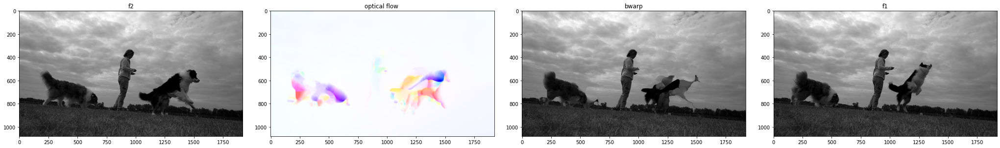

In [65]:
fig_size_default = 4
num_plot = 4
fig, axs = plt.subplots(1, num_plot, figsize= (fig_size_default*num_plot *ratio , fig_size_default  )  , constrained_layout=True ) 
axs[0].imshow( img2.squeeze(),  interpolation=None,   cmap='gray' )
axs[0].set_title('f2')

axs[1].imshow( plot_color )
axs[1].set_title('optical flow ')

axs[2].imshow(result.squeeze(),  interpolation=None,   cmap='gray'  )
axs[2].set_title('bwarp')

axs[3].imshow( img1.squeeze() ,  interpolation=None,   cmap='gray'       )
axs[3].set_title('f1')
 

plt.show()


## NVIDIA HW optical flow

opencv ver :  4.5.5
(2160, 3840) (2160, 3840)
(1080, 1920) (1080, 1920)
init nv hw of2, slow level , grid 2 2 
<cuda_NvidiaOpticalFlow_2_0 0x7faed4014f10>
cal nvhwof2 
stat before convert :  11576 -3744 211.14021604938273
(1080, 1920, 2)

(1080, 1920, 2)
stat :  180.875 -58.5 3.299065875771605


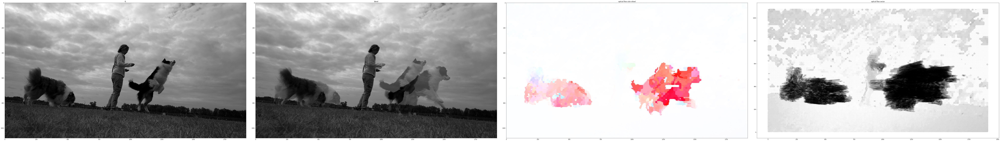

In [68]:
import numpy as np 
import cv2


print("opencv ver : ", cv2.__version__)

frame1 = (cv2.imread('./00033.jpg', cv2.IMREAD_GRAYSCALE))
frame2 = (cv2.imread('./00036.jpg', cv2.IMREAD_GRAYSCALE))
print( frame1.shape, frame2.shape )
W,H =  int(frame1.shape[1]/2), int(frame1.shape[0]/2 )

frame1 = cv2.resize(frame1, ( W,H  ) )
frame2 = cv2.resize(frame2, ( W,H  ) )

print( frame1.shape, frame2.shape )
print("init nv hw of2, slow level , grid 2 2 ")
nvof = cv2.cuda_NvidiaOpticalFlow_2_0.create(( W,H ), \
                                             cv2.cuda.NvidiaOpticalFlow_2_0_NV_OF_PERF_LEVEL_SLOW, \
                                             cv2.cuda.NvidiaOpticalFlow_2_0_NV_OF_OUTPUT_VECTOR_GRID_SIZE_1, \
                                             cv2.cuda.NvidiaOpticalFlow_2_0_NV_OF_HINT_VECTOR_GRID_SIZE_1,  \
                                             False, False, False, 0)
print(nvof)

print("cal nvhwof2 ")
flow_nvhwof2 = nvof.calc(frame1, frame2, None)


print("stat before convert : ", np.max(flow_nvhwof2[0] )    , np.min(flow_nvhwof2[0] ) , np.mean(flow_nvhwof2[0]))


flow_nvhwof2_new = flow_nvhwof2[0] / 64.0
print(flow_nvhwof2_new.shape)


print()


plot_f1 = frame1
plot_f2 = frame2
plot_blend =  blendImages(plot_f1, plot_f2) 
plot_diff = frame1 - frame2 
plot_flow = flow_nvhwof2_new
plot_color = flow_to_color(plot_flow)
ratio =  plot_flow.shape[1] / plot_flow.shape[0] 

step = 4
scale = 0.5


print(plot_flow.shape)
print("stat : ", np.max(plot_flow )    , np.min(plot_flow ) , np.mean(plot_flow))

fig_size_default = 16
num_plot = 4
fig, axs = plt.subplots(1, num_plot, figsize= (fig_size_default*num_plot *ratio , fig_size_default  )  , constrained_layout=True ) 
axs[0].imshow( plot_f1,  interpolation=None,   cmap='gray' )
axs[0].set_title('f1')

axs[1].imshow(plot_blend ,  interpolation=None,   cmap='gray'  )
axs[1].set_title('blend')

axs[2].imshow( plot_color ,  interpolation=None,      )
axs[2].set_title('optical flow color wheel')
 
axs[3].quiver( np.arange(0, plot_flow.shape[1] -1, step), 
               np.arange( plot_flow.shape[0]-1 , -1, -step),             
               plot_flow[::step, ::step, 0], 
               plot_flow[::step, ::step, 1], 
               units='x', pivot='mid', width=0.5,  scale=scale, )

axs[3].set_title('optical flow vector')
plt.show()



In [69]:
import torch 
img1 = torch.from_numpy( plot_f1 [None,None,:,:].astype(np.float32)  )
img2 = torch.from_numpy( plot_f2 [None,None,:,:].astype(np.float32)   )
flow_new = torch.from_numpy(plot_flow[None,:,:,:].astype(np.float32)   )
print(img1.size(), img1.type(), flow_new.size(), flow_new.type() )
result = flow_warp(img2, flow_new, interp_mode='bilinear', padding_mode='zeros')
print(np.mean( np.abs((img1-result).squeeze().numpy()) ) )
print(np.mean( np.abs((img2-result).squeeze().numpy()) ) )

torch.Size([1, 1, 1080, 1920]) torch.FloatTensor torch.Size([1, 1080, 1920, 2]) torch.FloatTensor
torch.Size([1, 1, 1080, 1920]) torch.Size([1, 1080, 1920, 2])
torch.Size([1080, 1920]) torch.Size([1080, 1920])
torch.Size([1080, 1920, 2])
torch.Size([1, 1080, 1920, 2])
torch.Size([1, 1080, 1920]) torch.Size([1, 1080, 1920]) torch.Size([1, 1080, 1920, 2])
torch.FloatTensor torch.FloatTensor
7.2936482
6.6108212


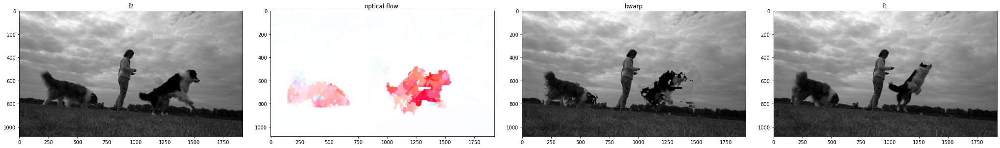

In [70]:
fig_size_default = 4
num_plot = 4
fig, axs = plt.subplots(1, num_plot, figsize= (fig_size_default*num_plot *ratio , fig_size_default  )  , constrained_layout=True ) 
axs[0].imshow( img2.squeeze(),  interpolation=None,   cmap='gray' )
axs[0].set_title('f2')

axs[1].imshow( plot_color )
axs[1].set_title('optical flow ')

axs[2].imshow(result.squeeze(),  interpolation=None,   cmap='gray'  )
axs[2].set_title('bwarp')

axs[3].imshow( img1.squeeze() ,  interpolation=None,   cmap='gray'       )
axs[3].set_title('f1')
 

plt.show()


In [71]:
img1 = torch.from_numpy( plot_f1 [None,None,:,:].astype(np.float32)  )
img2 = torch.from_numpy( plot_f2 [None,None,:,:].astype(np.float32)   )
flow_new = torch.from_numpy(plot_flow[None,:,:,:].astype(np.float32)   )
print(img1.size(), img2.type(), flow_new.size(), flow_new.type() )
result = custom_warp2(img2, flow_new)
print(np.mean( np.abs((img1-result).squeeze().numpy()) ) )
print(np.mean( np.abs((img2-result).squeeze().numpy()) ) )

torch.Size([1, 1, 1080, 1920]) torch.FloatTensor torch.Size([1, 1080, 1920, 2]) torch.FloatTensor
torch.Size([1, 1, 1080, 1920]) torch.Size([1, 1080, 1920, 2])
torch.Size([1080, 1920])
torch.Size([1080, 1920, 2])
torch.Size([1, 1080, 1920, 2])
torch.Size([1, 1080, 1920, 2])
torch.Size([1, 1080, 1920, 2])
torch.Size([1, 1, 1080, 1920]) torch.Size([1, 1080, 1920, 2])
b,c,h,w 1 1 1080 1920
xgrid torch.Size([1, 1080, 1920, 1]) ygrid torch.Size([1, 1080, 1920, 1])
xgrid torch.Size([1, 1080, 1920, 1]) ygrid torch.Size([1, 1080, 1920, 1])
grid torch.Size([1, 1080, 1920, 2])
<built-in method size of Tensor object at 0x7faed3bd1a40>
torch.Size([1, 1, 1080, 1920])
6.990366
6.569022


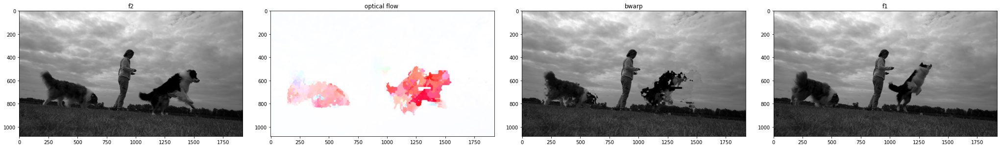

In [72]:
fig_size_default = 4
num_plot = 4
fig, axs = plt.subplots(1, num_plot, figsize= (fig_size_default*num_plot *ratio , fig_size_default  )  , constrained_layout=True ) 
axs[0].imshow( img2.squeeze(),  interpolation=None,   cmap='gray' )
axs[0].set_title('f2')

axs[1].imshow( plot_color )
axs[1].set_title('optical flow ')

axs[2].imshow(result.squeeze(),  interpolation=None,   cmap='gray'  )
axs[2].set_title('bwarp')

axs[3].imshow( img1.squeeze() ,  interpolation=None,   cmap='gray'       )
axs[3].set_title('f1')
 

plt.show()


# from warp code from ssm (error)


In [30]:
import numpy as np
import torch
import torch.nn as nn



class BackwardWarp(nn.Module):
    def __init__(self):
        super(BackwardWarp, self).__init__()
        #self.device = device
    # end

    def forward(self, tensorInput, tensorFlow):
        if hasattr(self, 'tensorGrid') == False or self.tensorGrid.size(0) != tensorFlow.size(0) or self.tensorGrid.size(2) != tensorFlow.size(2) or self.tensorGrid.size(3) != tensorFlow.size(3):
            tensorHorizontal = torch.linspace(-1.0, 1.0, tensorFlow.size(3)).view(1, 1, 1, tensorFlow.size(3)).expand(tensorFlow.size(0), -1, tensorFlow.size(2), -1)
            tensorVertical = torch.linspace(-1.0, 1.0, tensorFlow.size(2)).view(1, 1, tensorFlow.size(2), 1).expand(tensorFlow.size(0), -1, -1, tensorFlow.size(3))

            self.tensorGrid = torch.cat([ tensorHorizontal, tensorVertical ], 1)
            if torch.cuda.is_available():
                self.tensorGrid = self.tensorGrid
        # end

        tensorFlow = torch.cat([ tensorFlow[:, 0:1, :, :] / ((tensorInput.size(3) - 1.0) / 2.0),
                                 tensorFlow[:, 1:2, :, :] / ((tensorInput.size(2) - 1.0) / 2.0)], 1)
        out = torch.nn.functional.grid_sample(input=tensorInput, grid=(self.tensorGrid + tensorFlow).permute(0, 2, 3, 1),
                                              mode='bilinear', padding_mode='border')
        return out
    # end

class BackwardWarpMV(nn.Module):
    def __init__(self):
        super(BackwardWarpMV, self).__init__()
        self.warper = BackwardWarp()

    def forward(self, tensorInput, tensorFlow):
        num_channels = tensorFlow.size(1)//2
        U = tensorFlow[:,:num_channels]
        V = tensorFlow[:,num_channels:]
        out = []
        for j in range(num_channels):
            #uv = tensorFlow[:,[j,j+num_channels],:,:]
            uv = torch.cat([U[:,j:j+1], V[:,j:j+1]], 1)
            out_j = self.warper(tensorInput[:,j:j+1], uv)
            out.append(out_j)

        return torch.cat(out, 1)

In [31]:
bwarp = BackwardWarpMV()

In [27]:
img1 = torch.from_numpy( plot_f1 [None,None,:,:].astype(np.float32)  )
img2 = torch.from_numpy( plot_f2 [None,None,:,:].astype(np.float32)   )
flow_new = torch.from_numpy(plot_flow[None,:,:,:].astype(np.float32)   )
print(img1.size(), img1.type(), flow_new.size(), flow_new.type() )

result = bwarp(img2, flow_new)
#result = flow_warp(img2, flow_new, interp_mode='bilinear', padding_mode='zeros')


torch.Size([1, 1, 2160, 3840]) torch.FloatTensor torch.Size([1, 2160, 3840, 2]) torch.FloatTensor


In [28]:
print(result.size(), img1.size())

torch.Size([1, 1, 3840, 2]) torch.Size([1, 1, 2160, 3840])


In [29]:

print(np.mean( np.abs((img1-result).squeeze().numpy()) ) )
print(np.mean( np.abs((img2-result).squeeze().numpy()) ) )

RuntimeError: The size of tensor a (3840) must match the size of tensor b (2) at non-singleton dimension 3

In [118]:
plot_f1_torch = torch.from_numpy(frame1).unsqueeze(0)
plot_f2_torch = torch.from_numpy(frame2).unsqueeze(0)
plot_flow_torch  = torch.from_numpy(flow_tvl1_cpu).unsqueeze(0)

In [119]:
plot_f1_torch.shape

torch.Size([1, 2160, 3840])

In [120]:
result_f1_recon = bwarp(plot_f2_torch, plot_flow_torch)

IndexError: Dimension out of range (expected to be in range of [-3, 2], but got 3)